<a href="https://colab.research.google.com/github/ywa136/TensorGraphicalModels.jl/blob/master/tensor_graph_models_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multiway Covariance / Precision Matrix Estimation

For illustration of the **TensorGraphicalModel Julia package**, in this notebook we present examples applying various (inverse) covariance estimation algorithms to sythetic data.

In [ ]:
%%shell
set -e

#---------------------------------------------------#
JULIA_VERSION="1.7.1" # any version ≥ 0.7.0
JULIA_PACKAGES="IJulia BenchmarkTools Plots MIRTjim TensorToolbox LinearAlgebra SparseArrays Distributions Random https://github.com/ywa136/TensorGraphicalModels.jl"
JULIA_PACKAGES_IF_GPU="CUDA" # or CuArrays for older Julia versions
JULIA_NUM_THREADS=4
#---------------------------------------------------#

if [ -n "$COLAB_GPU" ] && [ -z `which julia` ]; then
  # Install Julia
  JULIA_VER=`cut -d '.' -f -2 <<< "$JULIA_VERSION"`
  echo "Installing Julia $JULIA_VERSION on the current Colab Runtime..."
  BASE_URL="https://julialang-s3.julialang.org/bin/linux/x64"
  URL="$BASE_URL/$JULIA_VER/julia-$JULIA_VERSION-linux-x86_64.tar.gz"
  wget -nv $URL -O /tmp/julia.tar.gz # -nv means "not verbose"
  tar -x -f /tmp/julia.tar.gz -C /usr/local --strip-components 1
  rm /tmp/julia.tar.gz

  # Install Packages
  if [ "$COLAB_GPU" = "1" ]; then
      JULIA_PACKAGES="$JULIA_PACKAGES $JULIA_PACKAGES_IF_GPU"
  fi
  for PKG in `echo $JULIA_PACKAGES`; do
    echo "Installing Julia package $PKG..."
    julia -e 'using Pkg; pkg"add '$PKG'; precompile;"' &> /dev/null
  done

  # Install kernel and rename it to "julia"
  echo "Installing IJulia kernel..."
  julia -e 'using IJulia; IJulia.installkernel("julia", env=Dict(
      "JULIA_NUM_THREADS"=>"'"$JULIA_NUM_THREADS"'"))'
  KERNEL_DIR=`julia -e "using IJulia; print(IJulia.kerneldir())"`
  KERNEL_NAME=`ls -d "$KERNEL_DIR"/julia*`
  mv -f $KERNEL_NAME "$KERNEL_DIR"/julia  

  echo ''
  echo "Successfully installed `julia -v`!"
  echo "Please reload this page (press Ctrl+R, ⌘+R, or the F5 key) then"
  echo "jump to the 'Checking the Installation' section."
fi

Installing Julia 1.7.1 on the current Colab Runtime...
2022-04-13 19:43:27 URL:https://storage.googleapis.com/julialang2/bin/linux/x64/1.7/julia-1.7.1-linux-x86_64.tar.gz [123374573/123374573] -> "/tmp/julia.tar.gz" [1]
Installing Julia package IJulia...
Installing Julia package BenchmarkTools...
Installing Julia package Plots...
Installing Julia package MIRTjim...
Installing Julia package TensorToolbox...
Installing Julia package LinearAlgebra...
Installing Julia package SparseArrays...
Installing Julia package Distributions...
Installing Julia package Random...
Installing Julia package https://github.com/ywa136/TensorGraphicalModels.jl...
Installing IJulia kernel...
[ Info: Installing julia kernelspec in /root/.local/share/jupyter/kernels/julia-1.7

Please reload this page (press Ctrl+R, ⌘+R, or the F5 key) then
jump to the 'Checking the Installation' section.


In [ ]:
versioninfo()

Julia Version 1.7.1
Commit ac5cc99908 (2021-12-22 19:35 UTC)
Platform Info:
  OS: Linux (x86_64-pc-linux-gnu)
  CPU: Intel(R) Xeon(R) CPU @ 2.20GHz
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-12.0.1 (ORCJIT, broadwell)
Environment:
  JULIA_NUM_THREADS = 4


In [ ]:
using TensorGraphicalModels
using TensorToolbox
using Plots
using MIRTjim: jim
using SparseArrays
using LinearAlgebra
using Distributions
using Random

### Kronecker product inverse covariance model

In [ ]:
model_type = "kp"
sub_model_type = "sb" #this defines the structure of the Kronecker factors, sb = star-block
K = 2
N = 1000
d_list = [10, 20]

X = TensorGraphicalModels.gen_kronecker_data(model_type, sub_model_type, K, N, d_list) #multi-dimensional array (tensor) of dimension d_1 × … × d_K × N
Ψ_hat_list = kglasso(X)

2-element Vector{Matrix{Float64}}:
 [0.6054448187911421 0.0 … 0.0 0.0; 0.0 0.6059484904984387 … 0.0 0.0; … ; 0.0 0.0 … 0.6187017372257297 0.0; 0.0 0.0 … 0.0 0.6349055232175542]
 [0.42154773857843225 0.0 … 0.0 0.0; 0.0 0.33523978401552174 … 0.0 0.0; … ; 0.0 0.0 … 0.5096108059507687 0.0; 0.0 0.0 … 0.0 0.5306557420273152]

In [ ]:
Omega = kron(Ψ_hat_list[1], Ψ_hat_list[2])

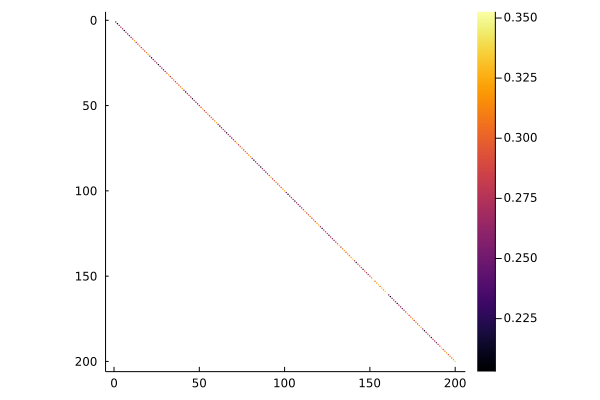

In [ ]:
spy(Omega)

### Kronecker sum inverse covariance model

In [ ]:
model_type = "ks"
sub_model_type = "sb" #this defines the structure of the Kronecker factors, sb = star-block
K = 3
N = 1000
d_list = [5, 10, 15]

X = TensorGraphicalModels.gen_kronecker_data(model_type, sub_model_type, K, N, d_list, tensorize_out = false) #matrix of dimension d × N

# compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
for k = 1:K
    for i = 1:N
        copy!(Xk[k], tenmat(reshape(X[:, i], Tuple(d_list)), k))
        mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
    end
end

Ψ_hat_list, _ = teralasso(X_kGram);

([[-0.44581514269687345 0.0 … 3.868270850093832e-5 7.803771142008461e-5; 0.0 -0.44588952196472675 … -4.887893241248693e-5 -0.0; … ; 3.868270850093859e-5 -4.887893241248682e-5 … -0.4374227724958019 -0.013677103076802637; 7.803771142008331e-5 -0.0 … -0.013677103076802642 -0.43734047641825513], [0.14433945602699652 -0.00559483748263841 … 0.0 0.0; -0.0055948374826384085 0.14452214194513868 … 0.0 -0.0; … ; 0.0 0.0 … 0.14268080524512178 -0.0002973892267576963; 0.0 -0.0 … -0.0002973892267576937 0.1465219834022063], [0.34139465332862834 -0.0034271684946238176 … -0.0 -0.0; -0.003427168494623822 0.33991545662296935 … 0.0 0.0; … ; -0.0 0.0 … 0.34411377836699925 -0.00047389978839493696; -0.0 0.0 … -0.00047389978839493415 0.33817696331048674]], Any[Any[13153.7681694681, 15.692846906813768, 0.04108074113793555, [[-0.45193140591522135 0.0 … 3.847320324316829e-5 7.780722514964297e-5; 0.0 -0.4520057006378439 … -4.881021820717344e-5 -0.0; … ; 3.847320324316859e-5 -4.8810218207173334e-5 … -0.443534864147

In [ ]:
Omega = sparse(kron(I(d_list[1]), I(d_list[2]), Ψ_hat_list[3]) + kron(I(d_list[1]), Ψ_hat_list[2], I(d_list[3])) + kron(Ψ_hat_list[1], I(d_list[2]), I(d_list[3])))

750×750 SparseMatrixCSC{Float64, Int64} with 4750 stored entries:
⢿⢗⣀⠀⠓⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠘⠿⣧⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠙⠀⠀⠙⢻⣶⣴⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠰⣿⣿⣿⡇⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠈⠉⠉⢿⣷⣀⠀⠓⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠘⠟⣥⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠙⠀⠀⠙⢻⣶⣶⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠸⣿⣿⣿⡅⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠁⠉⢿⣷⣀⠀⠑⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠘⠿⢇⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⠀⠀⠙⢱⣶⣶⣦⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠸⣿⣿⣿⣀⠀⠀⢀⠀⠀⠀⢀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠘⢿⣷⣀⠈⠓⠀⠀⠈⠳⣄⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢀⡀⠘⠿⣧⣄⠀⠀⠀⠀⠈⠳⣄⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⠀⠀⠙⢛⣴⣶⣦⠀⠀⠀⠈⠳⣄⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢀⡀⠀⠀⠀⠸⣿⣿⣿⢀⠀⠀⢀⠀⠈⠳⣄
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⠀⠀⠐⠿⣧⣄⠀⠓⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠀⢀⠀⠙⠿⣧⣄⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢦⡀⠀⠙⠀⠀⠙⢻⣶⣶⣦
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢦⠀⠀⠀⠀⠸⣿⣿⣿

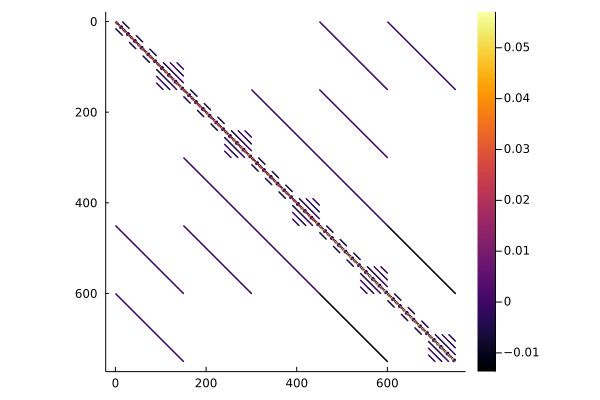

In [ ]:
spy(Omega)

### Sylvester inverse covariance model

In [ ]:
model_type = "sylvester"
sub_model_type = "sb" #this defines the structure of the Kronecker factors, sb = star-block
K = 3
N = 1000
d_list = [5, 10, 15]

X = TensorGraphicalModels.gen_kronecker_data(model_type, sub_model_type, K, N, d_list, tensorize_out = false) #matrix of dimension d × N

# compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
for k = 1:K
    for i = 1:N
        copy!(Xk[k], tenmat(reshape(X[:, i], Tuple(d_list)), k))
        mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
    end
end

Psi0 = [sparse(eye(d_list[k])) for k = 1:K]
fun = (iter, Psi) -> [1, time()] # NULL func
lambda = [sqrt(d_list[k] * log(prod(d_list)) / N) for k = 1:K] 

Ψ_hat_list, _ = syglasso_palm(X, X_kGram, lambda, Psi0, fun = fun)

(SparseMatrixCSC{Float64, Int64}[sparse([1, 5, 2, 3, 4, 3, 4, 5, 1, 4, 5], [1, 1, 2, 3, 3, 4, 4, 4, 5, 5, 5], [2.0417815781926465, 0.0, 2.0475242449648516, 2.051547864245802, 0.0, 0.0, 2.441220377117647, -1.073049605458762, 0.0, -1.073049605458762, 2.430699651749641], 5, 5), sparse([1, 2, 3, 4, 6, 7, 10, 1, 2, 6  …  8, 9, 10, 1, 3, 4, 7, 8, 9, 10], [1, 1, 1, 1, 1, 1, 1, 2, 2, 2  …  9, 9, 9, 10, 10, 10, 10, 10, 10, 10], [0.8390026993530608, -1.139115643482287, 0.0, 0.0, 0.004082363772748551, 0.0, 0.0, -1.139115643482287, 0.8212697471686189, 0.0  …  -0.13768661869634224, 0.631752379461246, -1.1218826370345645, 0.0, 0.0, 0.0, -1.1228022041851036, -1.08190659618453, -1.1218826370345645, 1.628495483277826], 10, 10), sparse([1, 2, 3, 1, 2, 3, 1, 2, 3, 4  …  12, 13, 14, 15, 10, 11, 12, 13, 14, 15], [1, 1, 1, 2, 2, 2, 3, 3, 3, 4  …  14, 14, 14, 14, 15, 15, 15, 15, 15, 15], [0.8520525098376074, -1.1134251138639364, 0.048903564185109785, -1.1134251138639364, 1.2911854049522624, -1.16152504972525

In [ ]:
Omega = kron(I(d_list[3]), I(d_list[2]), Ψ_hat_list[1]) + kron(I(d_list[3]), Ψ_hat_list[2], I(d_list[1])) + kron(Ψ_hat_list[3], I(d_list[2]), I(d_list[1]))
Omega .= Omega * copy(transpose(Omega))

750×750 SparseMatrixCSC{Float64, Int64} with 11130 stored entries:
⣿⣿⣘⣷⣅⣘⢾⣅⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⢶⣼⢻⣶⡟⠳⣔⠟⠃⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⣁⢹⢿⡉⡿⢏⢈⡿⠆⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠞⢷⣴⠝⣦⡴⠻⣦⡄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠈⠉⠀⠈⠁⠀⠉⣿⣿⣸⣷⣅⣝⢮⣀⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⢶⣾⢻⣶⡟⢷⣴⠛⠃⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⣅⢽⢿⣍⡿⣯⣭⠿⠆⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠊⢳⣴⠛⣧⡟⠛⣤⡄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠉⠀⠈⠁⠀⠉⣿⣿⣸⢷⣅⣝⢮⣀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢶⣞⢻⣶⡟⢷⣜⠛⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⣅⢽⢿⣍⡿⣯⣽⠿⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠊⢳⣶⠙⣷⡟⢻⣶⡀⡀⢀⢀⠀⡀⠀⢀⡀⡀⢀⢀⠀⡀⡀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠨⡕⣭⣨⢻⣅⡙⢦⡨⡷⣅⣨⢻⣅⡝⣮⣀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢐⣦⣚⢻⣶⡟⠳⣄⢙⢦⡛⢳⣶⡛⣷⣞⠛
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠠⣅⠹⢿⡉⠿⣧⣬⢻⣅⠿⢯⣬⠿⣧⡽⠿
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢀⡈⡳⣄⢙⣦⣛⢻⣶⣛⣷⣖⢙⣷⣎⣻⣶
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠨⠝⢯⣬⠳⣥⡝⢿⣼⠿⣧⡬⠳⣥⡝⢿⣤
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢐⣦⣚⢹⣶⡋⣷⣜⢙⢦⡋⢱⣶⡏⣷⣞⠉
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠠⣅⠽⢿⣬⠿⣧⡹⢿⣅⠿⢯⣭⠿⣧⣽⠿
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠊⢻⣾⠙⣷⡏⢻⣾⠛⣷⡞⠙⣷⡟⢻⣶

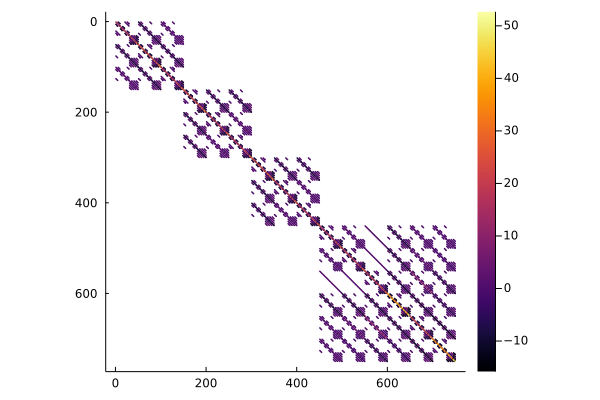

In [ ]:
spy(Omega)

### Kronecker PCA covariance model

In [ ]:
px = py = 25 #works for K=2 modes only
N = 100
X = zeros((px * py, N))

for i=1:N
    X[:, i] .= vec(rand(MatrixNormal(zeros((px, py)), 2.0*I(px), 4.0*I(py))))
end

S = cov(copy(X')) #sample covariance matrix
lambdaL = 20 * (px^2 + py^2 + log(max(px, py, N))) / N
lambdaS = 20 * sqrt(log(px * py)/N)

# robust Kronecker PCA methods using singular value thresholding
Sigma_hat = robust_kron_pca(S, px, py, lambdaL, lambdaS, "SVT"; tau = 0.5, r = 5);

In [ ]:
function zero_small!(M::AbstractMatrix, tol)
    for ι in eachindex(M)
        if abs(M[ι]) ≤ tol
            M[ι] = 0
        end
    end
    M
end

zero_small! (generic function with 1 method)

In [ ]:
zero_small!(Sigma_hat, 0.01);

In [ ]:
spy(sparse(Sigma_hat))